In this peroject, you will create a deep learning model that detects the TNt tubes formed in between cells. Below is a berief decsripton of what TNTs are:

"Tunneling nanotubes (TNTs) are elongated structures extending from and connecting cancer cell membranes. They permit the exchange of molecules, vesicles, and mitochondria, as well as genetic and metabolic signals that promote carcinogenesis. Given that they permit intercellular trafficking and communication, TNTs may serve as an important imaging biomarker of cancer cell response vs. resistance to therapy. On fluorescence imaging of cancer cell cultures, TNTs appear to be no thicker than 1 µm and vary in length from 10 to 100+ µm. TNTs can be spotted by a trained eye, but using human experts to obtain an accurate count and location of TNTs is a time-intensive process. A precise quantitative analysis of TNTs could aid in the objective assessment of cancer response to various therapeutic interventions."

In this project, the original images were created by taking a grid of 5 × 5 tiled images, each measuring 1388 × 1040 pixels, and then stitching them together. This process resulted in shadows along the stitched edges, which significantly degraded the model performance at later stages. You may start from removing these shadows. To remove those shadows, you may use BaSiC, an image correction method for background and shading correction for image sequences, available as a Fiji/ImageJ. You may consider other packages/lobraries for this purpose. You may also consider using different filters. You may check the following link: https://www.youtube.com/watch?v=xCHbcVUCYBI. You may find very useful short videos in that channel for image processing.

After preprocessing, you may want to divide the original image into smaller pieces. The original image in the training dataset was stitched together resulting in an image - size of 6283 × 4687 pixels. You can scan the images  with a sliding window of 512 × 512 pixels with a stride of 10 pixels, extracting patches containing the TNT regions using a bounding box. You may write a function that takes the window size as input. You may later create smaller images from 512x512 images using the same function.

Once you form training and test datasets from smaller images, you may simply train a VGG model. You may try different models. you goal is to find the images that contain TNTs. You may create multiple models that are trained with images with different sizes. 

# Image Preprocessing

This is the image with labels

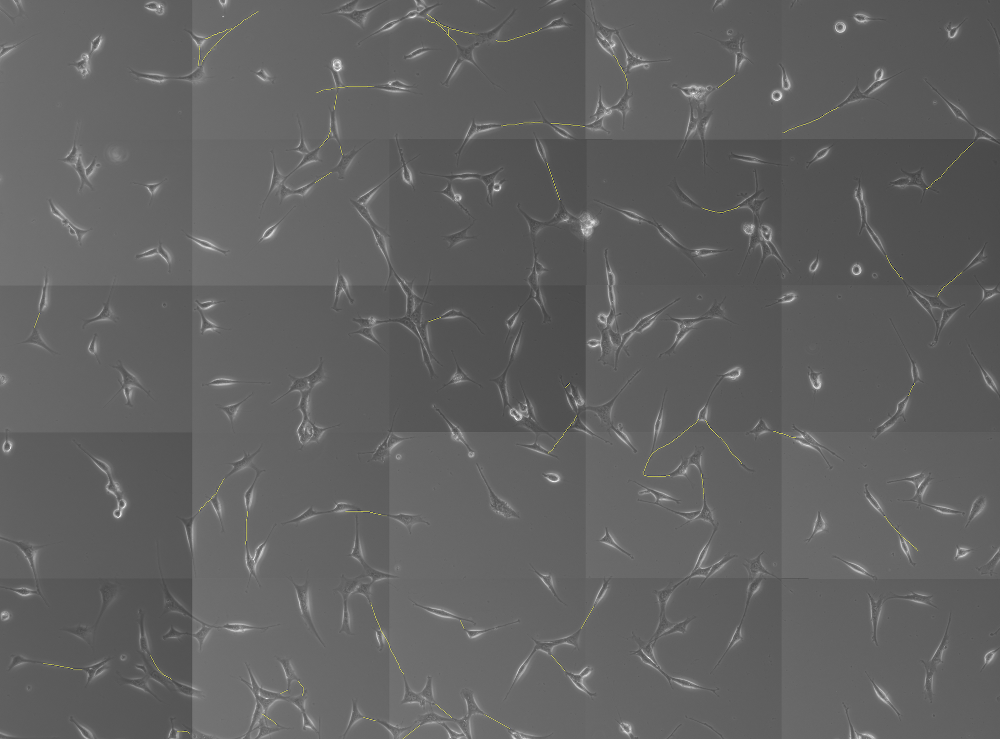

This is the same image without labels.

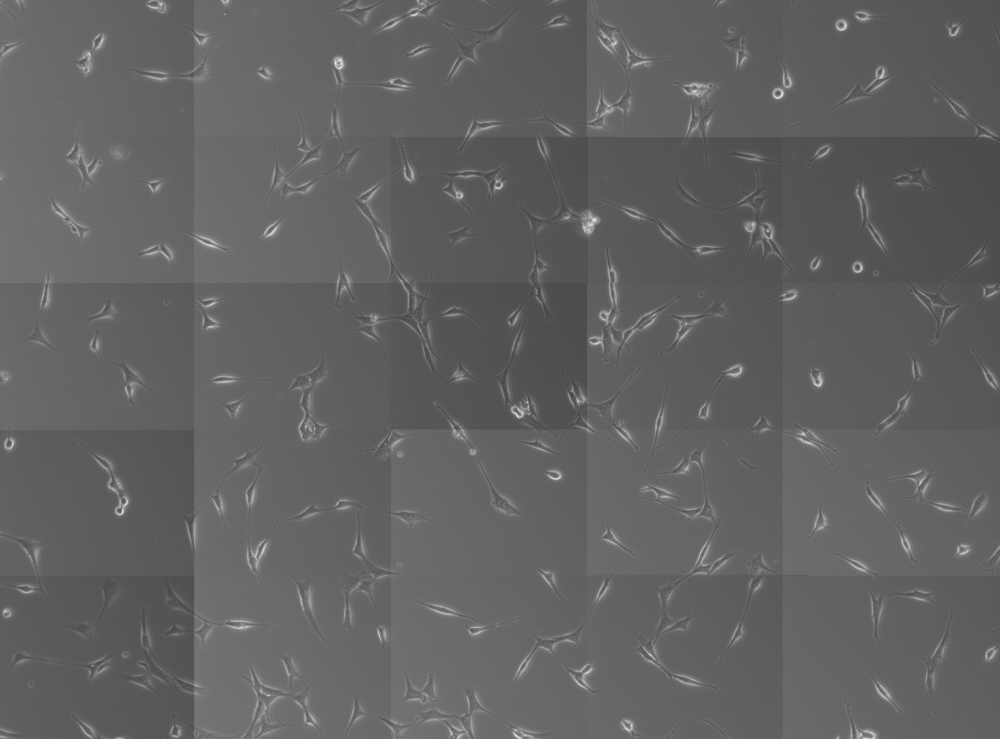

In [28]:
# Imports and GPU Startup
import os
# Remove any existing LD_LIBRARY_PATH to avoid conflicts
os.environ["LD_LIBRARY_PATH"] = "/usr/lib/x86_64-linux-gnu:/usr/local/cuda-12.5/lib64"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
os.environ["CUDA_HOME"] = "/usr/local/cuda-12.5"

import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)
        
import numpy as np
import pandas as pd 
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.utils import to_categorical
import tensorflow_addons as tfa
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import glob
from PIL import Image
        
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("TensorFlow version:", tf.__version__)
print("Built with CUDA:", tf.test.is_built_with_cuda())
print("GPU Device Name:", tf.test.gpu_device_name())
print("List of GPUs:", tf.config.list_physical_devices('GPU'))

2025-03-06 23:48:08.926870: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-06 23:48:09.022806: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741333689.068426   82055 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741333689.080475   82055 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-06 23:48:09.176839: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

Num GPUs Available:  1
TensorFlow version: 2.18.0
Built with CUDA: True


RuntimeError: cudaSetDevice() on GPU:0 failed. Status: CUDA-capable device(s) is/are busy or unavailable

- Create folders to save the images that are created by splitting the main image into smaller pieces


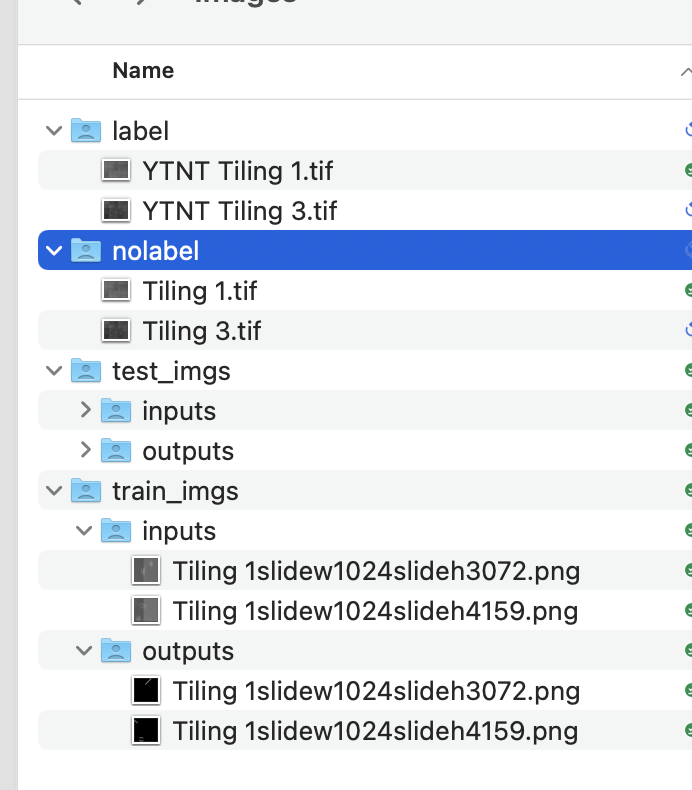

- Create smaller pieces from the main image by moving a window along the image. Mark the pieces with TNTs as 1 and all others as 0. This will give you the labeled images for your classification model.

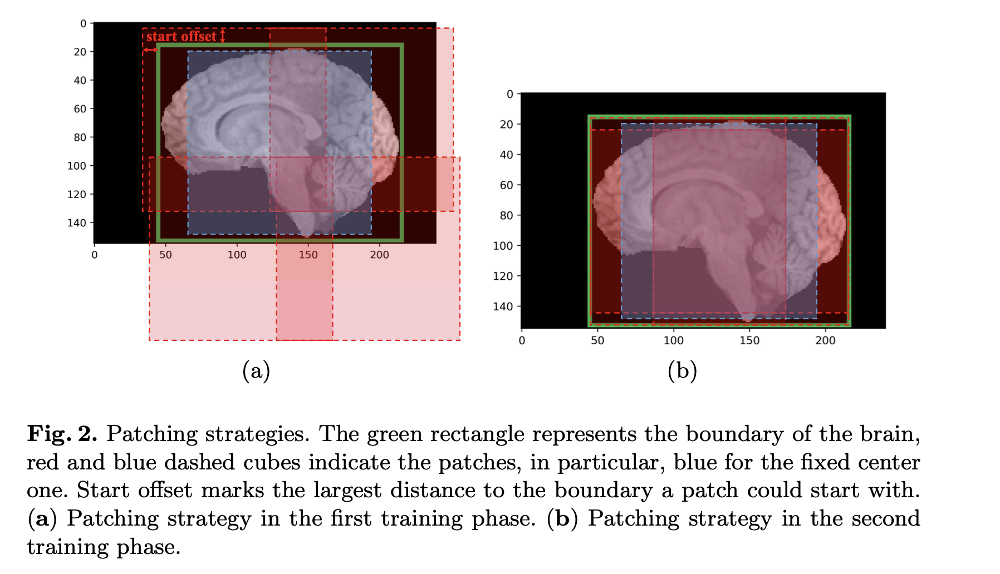

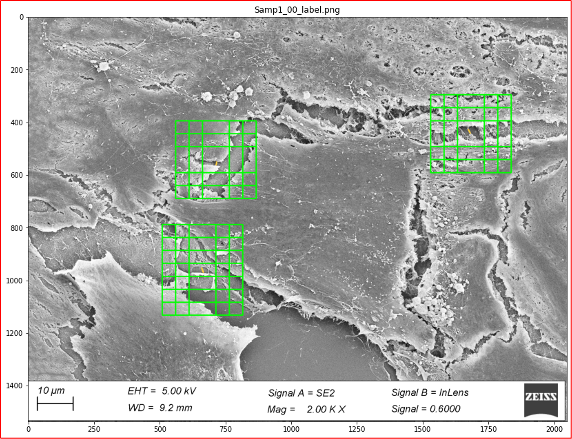

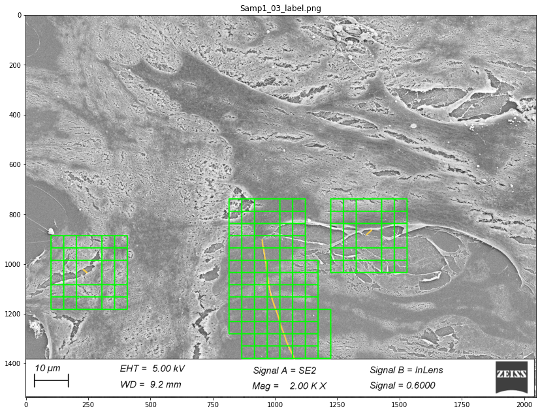

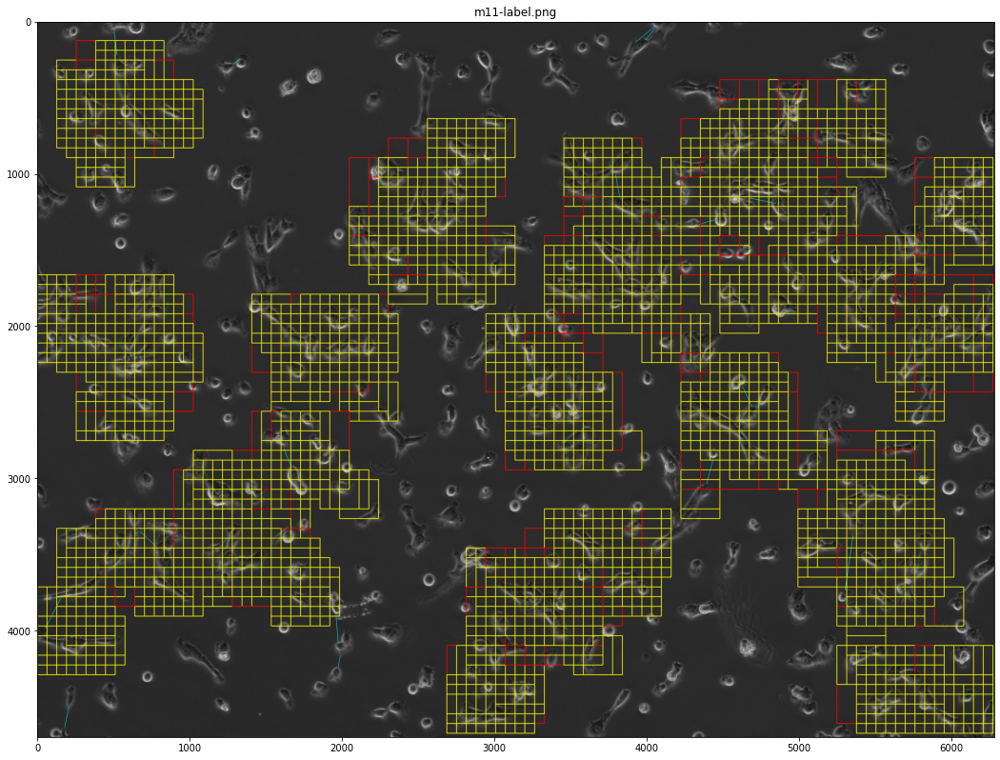

### A closer look at Images

In [1]:
import os
import cv2
import numpy as np
import glob

# Create output directories if they don't exist
os.makedirs('./data/tnt/nolabel', exist_ok=True)
os.makedirs('./data/tnt/label', exist_ok=True)

# Load the original images
image_nolabel = cv2.imread('./data/tnt/m05.png')
image_label = cv2.imread('./data/tnt/m05-label.png')

if image_nolabel is None or image_label is None:
    raise IOError("One or both input images could not be loaded.")

# Get image dimensions (expected around 4690x6278 pixels)
height, width, _ = image_nolabel.shape
print(f'height: {height}')
print(f'width: {width}')

height: 4690
width: 6278


In [2]:
# Get image dimensions (expected around 4690x6278 pixels)
height, width, _ = image_label.shape
print(f'height: {height}')
print(f'width: {width}')

height: 4690
width: 6278


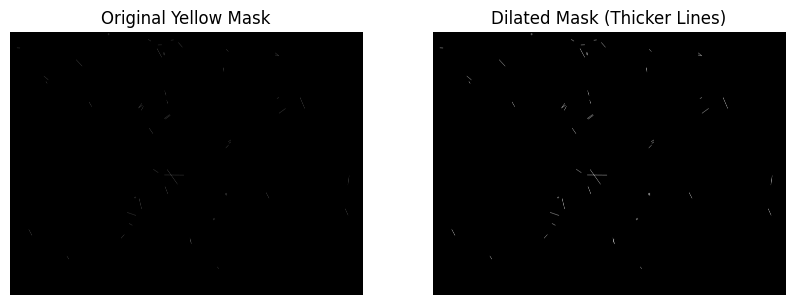

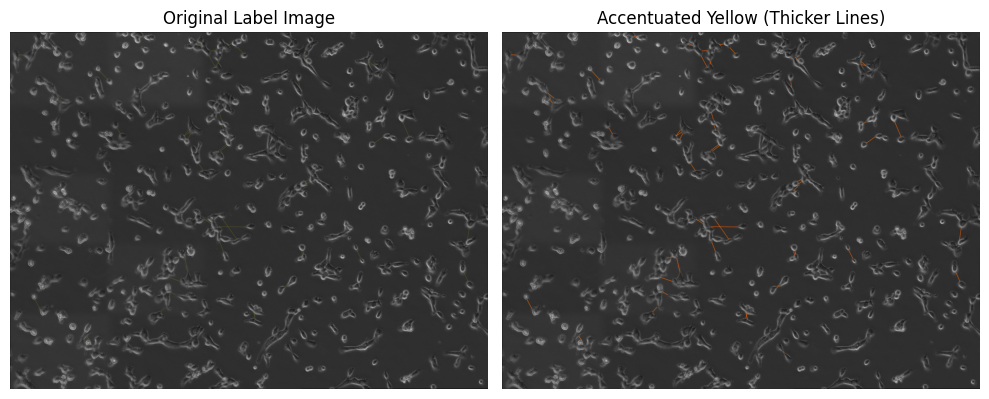

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the label image
image_label = cv2.imread('./data/tnt/m05-label.png')
if image_label is None:
    raise IOError("Input image could not be loaded.")

# Convert from BGR to HSV
image_label_hsv = cv2.cvtColor(image_label, cv2.COLOR_BGR2HSV)

# Define a broad hue range for yellow
lower_yellow = np.array([15, 50, 50])
upper_yellow = np.array([35, 255, 255])

# Create a mask of all yellow pixels
mask_yellow = cv2.inRange(image_label_hsv, lower_yellow, upper_yellow)

# DILATE the mask to make lines thicker.
# Increase kernel size or iterations to make lines thicker.
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
mask_yellow_dilated = cv2.dilate(mask_yellow, kernel, iterations=2)

# Display original vs. dilated mask to see the difference
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(mask_yellow, cmap='gray')
plt.title("Original Yellow Mask")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(mask_yellow_dilated, cmap='gray')
plt.title("Dilated Mask (Thicker Lines)")
plt.axis('off')

plt.show()

# Increase saturation and value for these *dilated* yellow pixels
image_label_hsv[..., 1] = np.where(mask_yellow_dilated > 0, 255, image_label_hsv[..., 1])  # Saturation
image_label_hsv[..., 2] = np.where(mask_yellow_dilated > 0, 255, image_label_hsv[..., 2])  # Value

# Convert back to BGR, then to RGB for plotting
accentuated_bgr = cv2.cvtColor(image_label_hsv, cv2.COLOR_HSV2BGR)
accentuated_rgb = cv2.cvtColor(accentuated_bgr, cv2.COLOR_BGR2RGB)
original_rgb = cv2.cvtColor(image_label, cv2.COLOR_BGR2RGB)

# Show side by side in the notebook
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.title('Original Label Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(accentuated_rgb)
plt.title('Accentuated Yellow (Thicker Lines)')
plt.axis('off')

plt.tight_layout()
plt.show()


In [4]:
# Define your filtering functions
def remove_shadows_color(image, kernel_size=(3,3)):
    """
    Remove shadows from an RGB image by processing the V channel in HSV.
    This function preserves hue and saturation.
    """
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
    background = cv2.morphologyEx(v, cv2.MORPH_OPEN, kernel)
    diff = cv2.subtract(v, background)
    norm = cv2.normalize(diff, None, alpha=0, beta=255,
                           norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    hsv_corrected = cv2.merge([h, s, norm])
    corrected_rgb = cv2.cvtColor(hsv_corrected, cv2.COLOR_HSV2RGB)
    return corrected_rgb

# Directories for saving tiles
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'
os.makedirs(nolabel_dir, exist_ok=True)
os.makedirs(label_dir, exist_ok=True)

# Load the full stitched images
image_nolabel = cv2.imread('./data/tnt/m05.png')  # Original no-label image
image_label   = cv2.imread('./data/tnt/m05-label.png')  # Label image with yellow lines

if image_nolabel is None or image_label is None:
    print("Error loading stitched images.")
    exit(1)

# Get the dimensions of the full images
height, width = image_nolabel.shape[:2]

# Define grid size for splitting (adjust rows and cols as needed)
rows, cols = 20, 20
tile_width = width // cols
tile_height = height // rows

tile_num = 1
for i in range(rows):
    for j in range(cols):
        # Calculate the top-left corner for the tile
        x = j * tile_width
        y = i * tile_height

        # Crop the tile from the no-label image
        tile_nolabel = image_nolabel[y:y + tile_height, x:x + tile_width]
        # Crop the tile from the label image
        tile_label = image_label[y:y + tile_height, x:x + tile_width]

        # ----------------------- Apply Filtering -----------------------
        # For the no-label tile:
        # Convert from BGR to RGB for filtering
        tile_nolabel_rgb = cv2.cvtColor(tile_nolabel, cv2.COLOR_BGR2RGB)
        # Remove shadows from the tile
        tile_nolabel_filtered_rgb = remove_shadows_color(tile_nolabel_rgb, kernel_size=(3, 3))
        # Convert back to BGR for saving
        tile_nolabel_filtered = cv2.cvtColor(tile_nolabel_filtered_rgb, cv2.COLOR_RGB2BGR)

        # For the label tile:
        # Convert from BGR to RGB
        tile_label_rgb = cv2.cvtColor(tile_label, cv2.COLOR_BGR2RGB)
        # Remove shadows only (do not accentuate yellow here)
        tile_label_filtered_rgb = remove_shadows_color(tile_label_rgb, kernel_size=(3, 3))
        # Convert back to BGR for further processing
        tile_label_filtered = cv2.cvtColor(tile_label_filtered_rgb, cv2.COLOR_RGB2BGR)
        # Now convert the filtered label tile to HSV and extract the yellow mask.
        hsv_tile = cv2.cvtColor(tile_label_filtered, cv2.COLOR_BGR2HSV)
        # Define the HSV range for yellow (adjust these values as needed)
        lower_yellow = np.array([20, 100, 100])
        upper_yellow = np.array([30, 255, 255])
        mask = cv2.inRange(hsv_tile, lower_yellow, upper_yellow)
        binary_mask = mask
        # -----------------------------------------------------------------

        # Define file names for the tiles
        nolabel_filename = os.path.join(nolabel_dir, f'tnt_tile{tile_num}.tif')
        label_filename   = os.path.join(label_dir, f'ytnt_tile{tile_num}.tif')

        # Save the processed tiles
        cv2.imwrite(nolabel_filename, tile_nolabel_filtered)
        cv2.imwrite(label_filename, binary_mask)

        tile_num += 1

print(f"Saved {tile_num - 1} tiles in both the 'nolabel' and 'label' directories.")

Saved 400 tiles in both the 'nolabel' and 'label' directories.


Total samples available: 400


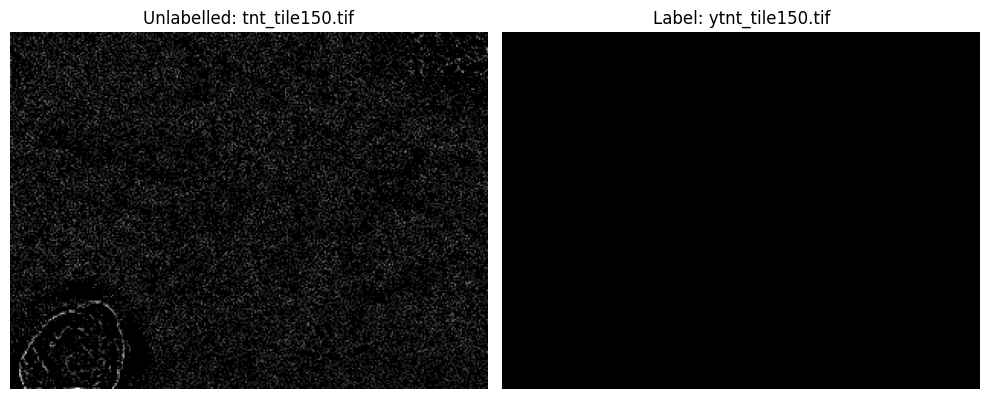

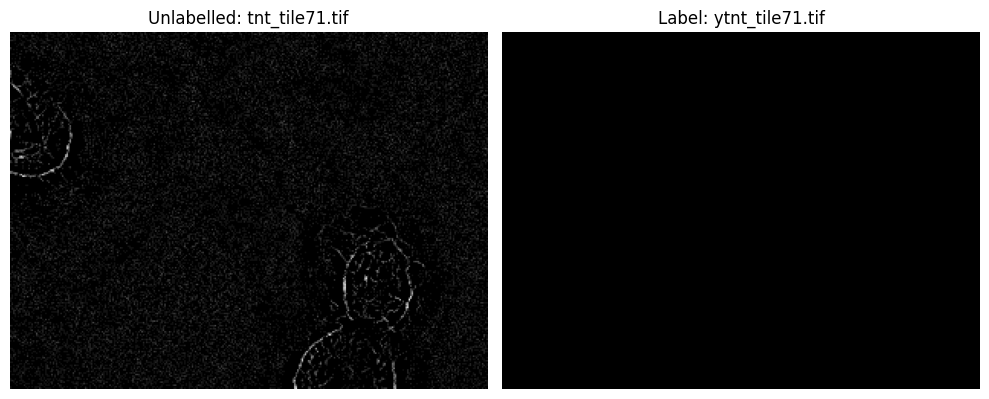

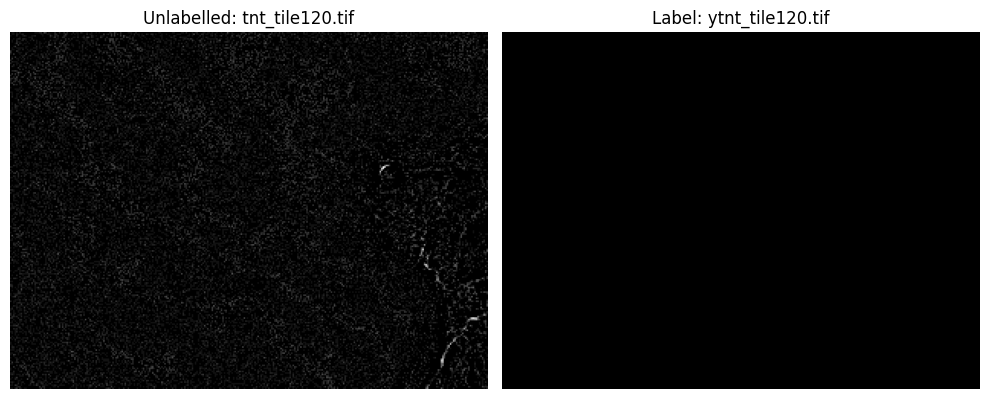

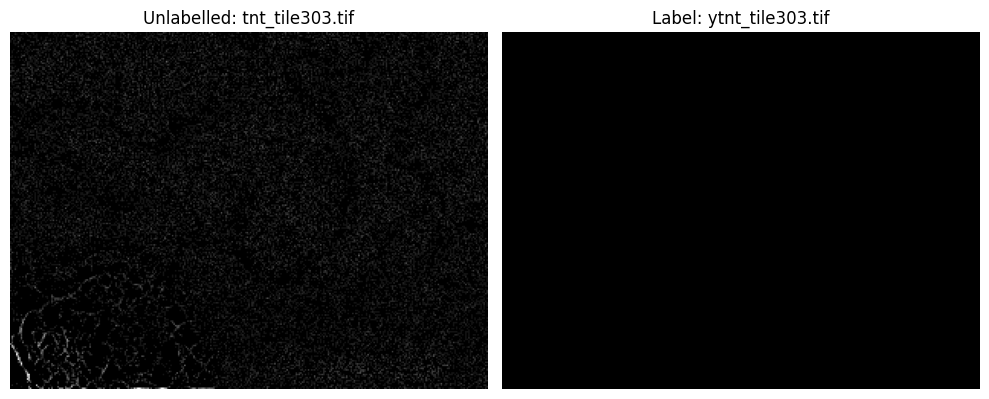

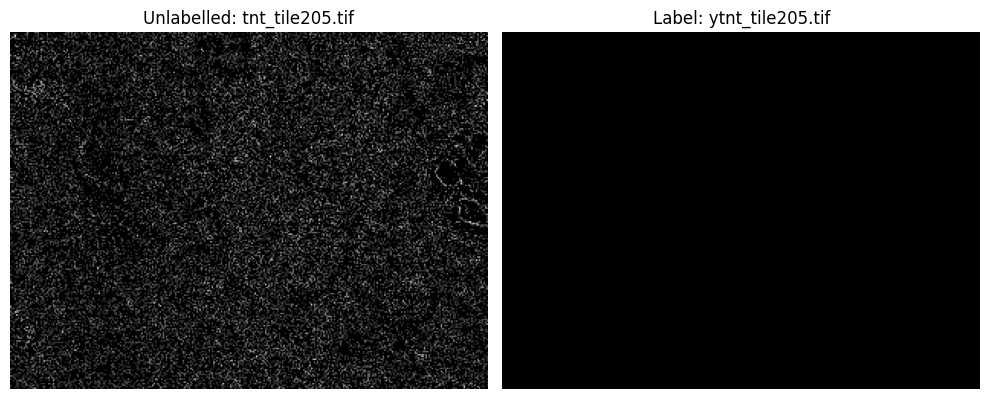

...

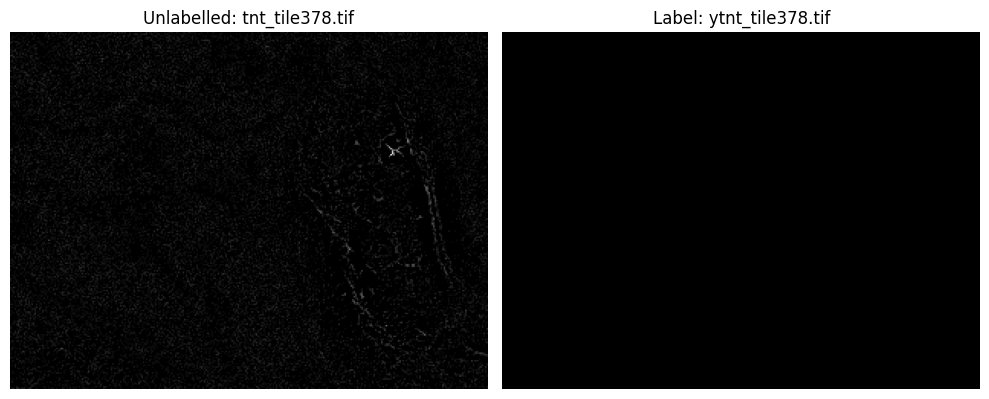

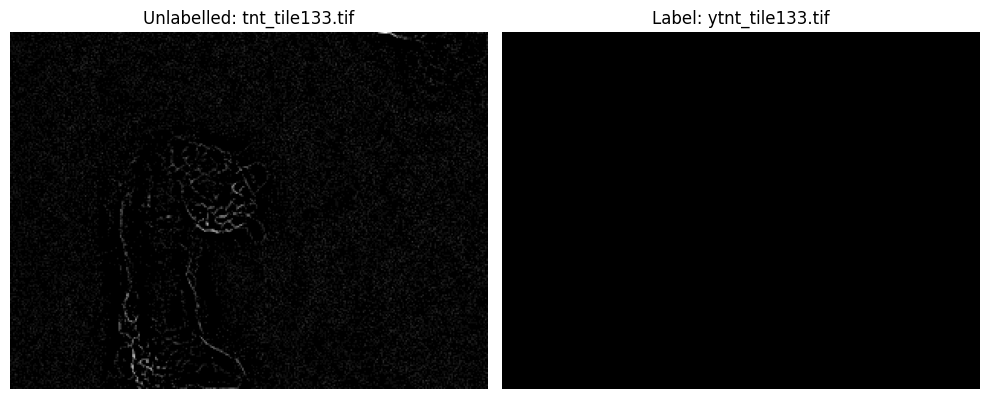

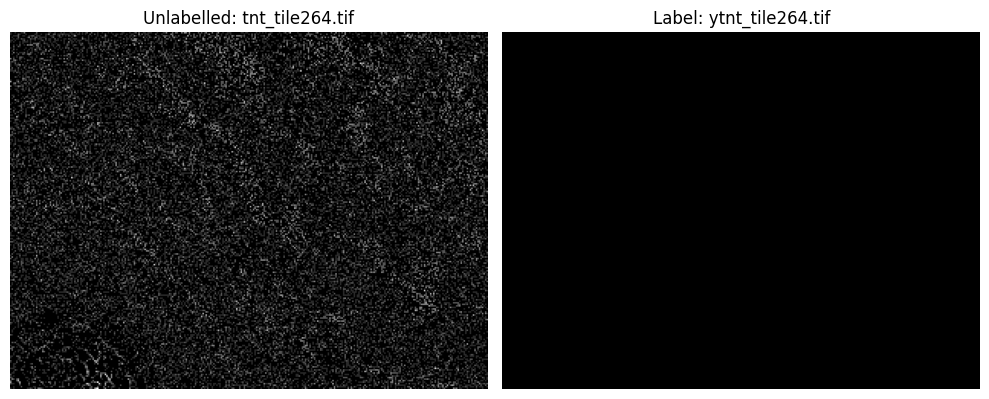

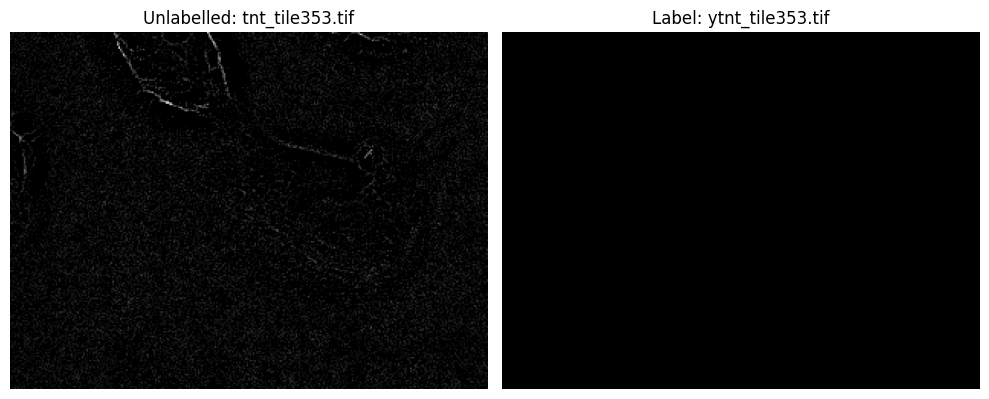

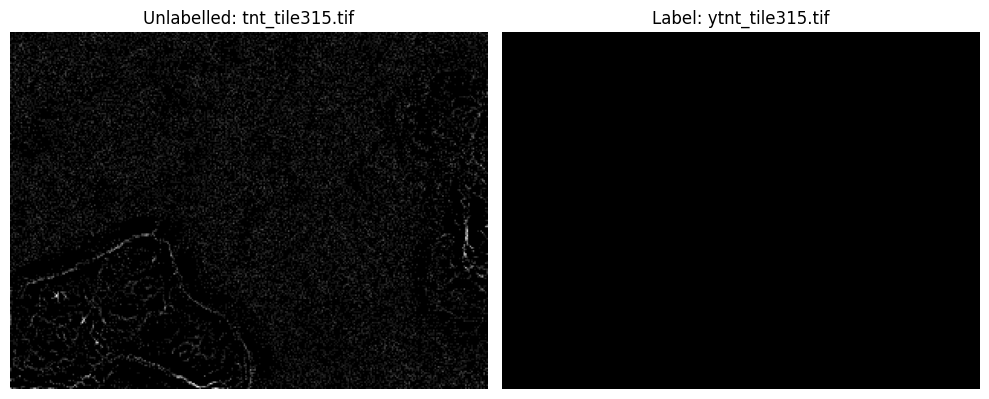

In [5]:
# Plot 25 pairs of corresponding label and non-labelled pictures side by side

import os
import cv2
import matplotlib.pyplot as plt
import random

# Directories containing the images
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'

# Get the lists of filenames
nolabel_files = sorted(os.listdir(nolabel_dir))
label_files = sorted(os.listdir(label_dir))

# Ensure both lists have the same length (or adjust accordingly)
num_samples = len(nolabel_files)
print("Total samples available:", num_samples)

# Randomly choose 25 indices (or fewer if not enough samples)
sample_count = 25
indices = random.sample(range(num_samples), min(sample_count, num_samples))

# Loop over the selected indices and display the corresponding pairs
for idx in indices:
    nl_file = nolabel_files[idx]
    lab_file = label_files[idx]
    nl_path = os.path.join(nolabel_dir, nl_file)
    lab_path = os.path.join(label_dir, lab_file)
    
    # Load the unlabelled image (color image)
    nl_image = cv2.imread(nl_path)
    if nl_image is None:
        print(f"Could not load image: {nl_path}")
        continue
    # Convert from BGR (OpenCV default) to RGB for displaying with matplotlib
    nl_image_rgb = cv2.cvtColor(nl_image, cv2.COLOR_BGR2RGB)
    
    # Load the labelled image (binary mask); load as grayscale for simplicity
    lab_image = cv2.imread(lab_path, cv2.IMREAD_GRAYSCALE)
    if lab_image is None:
        print(f"Could not load image: {lab_path}")
        continue

    # Create a figure with two subplots side by side
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(nl_image_rgb)
    plt.title(f'Unlabelled: {nl_file}')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(lab_image, cmap='gray')
    plt.title(f'Label: {lab_file}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()



# classification model training



- Use cv2.threshold and cv2.dilate to create image masks

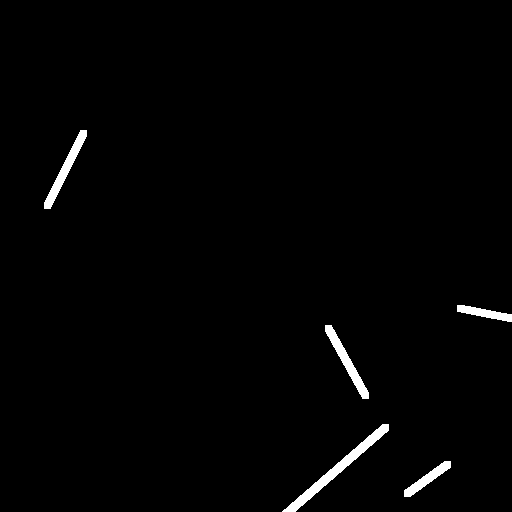

- Use transfer learning to create a classification model for images with and without TNTs
- You can start from and use VGG16
- Your goal is to run as many as models as the types of images you created in the preprocessing step, that is, if you created images of size 512 and 250 pixels, then you will have two models for each image size.

In [6]:
import os
import glob
import pandas as pd
import cv2
import numpy as np

# Directories for your tiles
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'

# Get all tile paths
nolabel_paths = sorted(glob.glob(os.path.join(nolabel_dir, "*.tif")))
label_paths   = sorted(glob.glob(os.path.join(label_dir, "*.tif")))

# Verify both lists have the same length (assuming perfect pairing)
assert len(nolabel_paths) == len(label_paths), \
       "Mismatch between number of nolabel and label tiles."

# Create DataFrame
df = pd.DataFrame({
    "nolabel_path": nolabel_paths,
    "label_path": label_paths
})

def check_mask_has_tnt(label_path):
    """
    Returns 1 if the mask has any foreground pixels (>0), else 0.
    """
    mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        raise ValueError(f"Could not load label image: {label_path}")
    # Check if any pixel is > 0
    return 1 if np.any(mask > 0) else 0
    
df["has_tnt"] = df["label_path"].apply(check_mask_has_tnt)
print(df.sample(15))

                           nolabel_path                         label_path  \
200   ./data/tnt/nolabel/tnt_tile28.tif   ./data/tnt/label/ytnt_tile28.tif   
55   ./data/tnt/nolabel/tnt_tile149.tif  ./data/tnt/label/ytnt_tile149.tif   
359   ./data/tnt/nolabel/tnt_tile62.tif   ./data/tnt/label/ytnt_tile62.tif   
74   ./data/tnt/nolabel/tnt_tile166.tif  ./data/tnt/label/ytnt_tile166.tif   
333    ./data/tnt/nolabel/tnt_tile4.tif    ./data/tnt/label/ytnt_tile4.tif   
309  ./data/tnt/nolabel/tnt_tile378.tif  ./data/tnt/label/ytnt_tile378.tif   
48   ./data/tnt/nolabel/tnt_tile142.tif  ./data/tnt/label/ytnt_tile142.tif   
261  ./data/tnt/nolabel/tnt_tile334.tif  ./data/tnt/label/ytnt_tile334.tif   
149  ./data/tnt/nolabel/tnt_tile233.tif  ./data/tnt/label/ytnt_tile233.tif   
302  ./data/tnt/nolabel/tnt_tile371.tif  ./data/tnt/label/ytnt_tile371.tif   
256   ./data/tnt/nolabel/tnt_tile33.tif   ./data/tnt/label/ytnt_tile33.tif   
86   ./data/tnt/nolabel/tnt_tile177.tif  ./data/tnt/label/ytnt_t

In [7]:
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(df, test_size=0.2, random_state=42, shuffle=True)
print("Training samples:", len(train_df))
print("Validation samples:", len(val_df))


Training samples: 320
Validation samples: 80


In [ ]:
import tensorflow as tf
import numpy as np
from PIL import Image

IMG_SIZE = (512, 512)

def load_image_and_mask(nolabel_path, label_path):
    """
    Returns a tuple (image, mask) as float32 arrays, scaled to [0,1].
    """
    # Load color image (no-label) with PIL
    image = Image.open(nolabel_path).convert('RGB')
    image = image.resize(IMG_SIZE, Image.BILINEAR)
    image = np.array(image).astype(np.float32) / 255.0

    # Load label image (grayscale), threshold to binary [0 or 1]
    mask = Image.open(label_path).convert('L')
    mask = mask.resize(IMG_SIZE, Image.NEAREST)
    mask = np.array(mask).astype(np.float32) / 255.0
    mask = (mask > 0.5).astype(np.float32)
    mask = np.expand_dims(mask, axis=-1)

    return image, mask

def load_image_and_mask_tf(nolabel_path, label_path):
    """
    A TF wrapper that allows loading data via tf.py_function in a tf.data pipeline.
    """
    [image, mask] = tf.py_function(
        func=load_image_and_mask,
        inp=[nolabel_path, label_path],
        Tout=[tf.float32, tf.float32]
    )
    # Set shape so TF knows the dimensionality
    image.set_shape([IMG_SIZE[0], IMG_SIZE[1], 3])
    mask.set_shape([IMG_SIZE[0], IMG_SIZE[1], 1])
    return image, mask

def build_tf_dataset(paths_df, batch_size=2, shuffle=True):
    """
    Builds a tf.data.Dataset from our DataFrame of paths.
    """
    nolabel_list = paths_df["nolabel_path"].values
    label_list   = paths_df["label_path"].values

    # Convert to tf.string
    nolabel_tensor = tf.constant(nolabel_list, dtype=tf.string)
    label_tensor   = tf.constant(label_list,   dtype=tf.string)
    
    # Build dataset
    dataset = tf.data.Dataset.from_tensor_slices((nolabel_tensor, label_tensor))
    if shuffle:
        dataset = dataset.shuffle(len(paths_df))
    
    # Map to load the data
    dataset = dataset.map(load_image_and_mask_tf, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# Build train and validation datasets
train_ds = build_tf_dataset(train_df, batch_size=2, shuffle=True)
val_ds   = build_tf_dataset(val_df,   batch_size=2, shuffle=False)


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

# Function to load and preprocess a test image (same preprocessing as training)
def load_test_image(image_path, target_size=(512,512)):
    img = load_img(image_path, target_size=target_size)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0  # scale to [0,1]
    return img

# Paths for a test image and its ground truth label
test_image_path = './data/tnt/m05.png'
test_label_path = './data/tnt/m05-label.png'

# Load and predict on the test image
test_img = load_test_image(test_image_path)
test_img_input = np.expand_dims(test_img, axis=0)
pred_mask = model.predict(test_img_input)

# Use a higher threshold (e.g., 0.08) to generate a cleaner binary mask
pred_mask_bin = (pred_mask > 0.037).astype(np.uint8) * 255

# Squeeze extra dimensions to get a 2D image (e.g., from (1,512,512,1) to (512,512))
pred_mask_bin = np.squeeze(pred_mask_bin)

# Optionally apply a morphological closing to clean up the mask (removes small holes)
kernel = np.ones((3,3), np.uint8)
pred_mask_bin = cv2.morphologyEx(pred_mask_bin, cv2.MORPH_CLOSE, kernel)

print("Sum of mask pixel values:", np.sum(pred_mask_bin))

# Convert test image to uint8 and BGR format
test_img_uint8 = (test_img * 255).astype(np.uint8)
test_img_bgr = cv2.cvtColor(test_img_uint8, cv2.COLOR_RGB2BGR)

# Threshold for pixel detection
pixel_threshold = 0.037

# Find pixels where mask exceeds threshold
mask_coords = np.column_stack(np.where(pred_mask_bin > pixel_threshold))

# Draw individual rectangles for each detected pixel
for y, x in mask_coords:
    cv2.rectangle(test_img_bgr, (x, y), (x+1, y+1), (0, 0, 255), 1)

# Convert image to RGB for visualization
pred_vis = cv2.cvtColor(test_img_bgr, cv2.COLOR_BGR2RGB)

# -----------------------------------------------------------------------
# Process ground truth for visualization with yellow contours
# -----------------------------------------------------------------------

# Load ground-truth label image for comparison
gt_img = load_test_image(test_label_path, target_size=(512,512))
gt_img = (gt_img * 255).astype(np.uint8)

# Convert to 3-channel image if it's grayscale
if gt_img.shape[-1] == 1:
    gt_img_color = cv2.cvtColor(gt_img, cv2.COLOR_GRAY2BGR)
else:
    gt_img_color = cv2.cvtColor(gt_img, cv2.COLOR_RGB2BGR)

# Threshold the ground truth image to ensure a binary mask
_, gt_mask_bin = cv2.threshold(gt_img_color[:,:,0], 127, 255, cv2.THRESH_BINARY)

# Morphological operations to unify lines
kernel_gt = np.ones((3,3), np.uint8)
gt_mask_bin = cv2.morphologyEx(gt_mask_bin, cv2.MORPH_CLOSE, kernel_gt)
# Optionally dilate further if lines remain broken:
# gt_mask_bin = cv2.dilate(gt_mask_bin, kernel_gt, iterations=1)

# Find contours in the closed mask
contours_gt, _ = cv2.findContours(gt_mask_bin.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw yellow contours (BGR: (0, 255, 255)) with thicker lines
for cnt in contours_gt:
    cv2.drawContours(gt_img_color, [cnt], -1, (0, 255, 255), thickness=3)

# Convert the ground truth visualization from BGR to RGB for matplotlib
gt_vis = cv2.cvtColor(gt_img_color, cv2.COLOR_BGR2RGB)

# -----------------------------------------------------------------------
# Display with subplots: predicted mask, predicted TNT, ground truth mask, final GT with lines
# -----------------------------------------------------------------------

plt.figure(figsize=(12, 8))

# (2,2,1): Predicted binary mask (for debugging)
plt.subplot(2,2,1)
plt.imshow(pred_mask_bin, cmap='gray')
plt.title("Predicted Binary Mask")
plt.axis('off')

# (2,2,2): Predicted TNT Regions (red boxes)
plt.subplot(2,2,2)
plt.imshow(pred_vis)
plt.title("Predicted TNT Regions (Red Boxes)")
plt.axis('off')

# (2,2,3): Optionally show the morphological GT mask for debugging
plt.subplot(2,2,3)
plt.imshow(gt_mask_bin, cmap='gray')
plt.title("Ground Truth Mask (Closed)")
plt.axis('off')

# (2,2,4): Final GT with drawn yellow lines
plt.subplot(2,2,4)
plt.imshow(gt_vis)
plt.title("Unlabeled + Yellow Lines")
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming pred_mask is the model output with shape (1, 512, 512, 1)
pred_prob = pred_mask.squeeze()  # shape: (512, 512)

# Plot histogram of predicted probabilities
plt.figure()
plt.hist(pred_prob.flatten(), bins=100)
plt.title("Histogram of Predicted Probabilities")
plt.xlabel("Probability")
plt.ylabel("Frequency")
plt.show()

# Try different thresholds
thresholds = [0.004, 0.005, 0.006]
for thresh in thresholds:
    pred_mask_bin = (pred_prob > thresh).astype(np.uint8) * 255
    print(f"Threshold: {thresh}, Sum of mask pixel values: {np.sum(pred_mask_bin)}")
    plt.figure()
    plt.imshow(pred_mask_bin, cmap='gray')
    plt.title(f"Binary Mask with Threshold = {thresh}")
    plt.axis('off')
    plt.show()


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import random
import numpy as np
from tensorflow.keras.preprocessing.image import load_img

# Directories containing the images
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'

# Get the lists of filenames
nolabel_files = sorted(os.listdir(nolabel_dir))
label_files = sorted(os.listdir(label_dir))

# Ensure both lists have the same length (or adjust accordingly)
num_samples = len(nolabel_files)
print("Total samples available:", num_samples)

# Randomly choose 25 indices (or fewer if not enough samples)
sample_count = 25
indices = random.sample(range(num_samples), min(sample_count, num_samples))

# Function to load and preprocess a test image
def load_test_image(image_path, target_size=(512,512)):
    img = load_img(image_path, target_size=target_size)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0  # scale to [0,1]
    return img

# Loop over the selected indices and display the corresponding pairs
for idx in indices:
    nl_file = nolabel_files[idx]
    lab_file = label_files[idx]
    nl_path = os.path.join(nolabel_dir, nl_file)
    lab_path = os.path.join(label_dir, lab_file)
    
    # Load the unlabelled image (color image)
    nl_image = cv2.imread(nl_path)
    if nl_image is None:
        print(f"Could not load image: {nl_path}")
        continue
    # Convert from BGR (OpenCV default) to RGB for displaying with matplotlib
    nl_image_rgb = cv2.cvtColor(nl_image, cv2.COLOR_BGR2RGB)
    
    # Load the labelled image (binary mask); load as grayscale for simplicity
    lab_image = cv2.imread(lab_path, cv2.IMREAD_GRAYSCALE)
    if lab_image is None:
        print(f"Could not load image: {lab_path}")
        continue
    
    # Predict nanotubes using the model
    test_img = load_test_image(nl_path)
    test_img_input = np.expand_dims(test_img, axis=0)
    pred_mask = model.predict(test_img_input)
    pred_mask_bin = (pred_mask > 0.08).astype(np.uint8) * 255  # Threshold
    pred_mask_bin = np.squeeze(pred_mask_bin)
    
    # Overlay small red pixels where the model predicts nanotubes
    prediction_overlay = nl_image_rgb.copy()
    mask_coords = np.column_stack(np.where(pred_mask_bin > 0))
    for y, x in mask_coords:
        cv2.rectangle(prediction_overlay, (x, y), (x+1, y+1), (255, 0, 0), 1)
    
    # Create a figure with three subplots side by side
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(nl_image_rgb)
    plt.title(f'Unlabelled: {nl_file}')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(prediction_overlay)
    plt.title(f'Predicted Nanotubes: {nl_file}')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(lab_image, cmap='gray')
    plt.title(f'Label: {lab_file}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
